Here, each agent has a specialized instrument of production. Either a sector 1 producer or sector 2 producer
This should incentivize them to go to market since no single agent can produce all their own requirements.

But we see the actions of the agents jump around and do not quite converge to anything.
The null decision even has little spurts where it is attempted

Now one possible explanation could be the following:

The agents are all using a single NN.

There is centralized learning and decentralized execution.

The agents do not have an input state telling them of their instrument of production.

So differing production policies are being trained on, and asked of, the single NN for all agents.

Remember, each sector is a unique output of the NN.

Adding a new input which is an agent index (agent ID) may help differentiate policies (each agent results in a unique input since each agent has a unique ID).

Alternatively, including productivity inputs may be useful (if not already done?), but may get needlessly complicated. Because...

Productivity has two aspects:
    * A quantity of goods which make up the instruments of production (assumed to be 1, and not explicitly modeled here)
    * A productivity matrix which maps labor sector inputs to product sector outputs.
        

Even after adding agent IDs to observations, the results are still messy and deficits do not go to zero

The batch size is 1000 = N agents
* Try increasing batch size to 2000

In [1]:
import time
import seaborn as sns

In [2]:
import Agents
import Instruments
import Markets

import Simulate
import Environment

import QNN

import SimPlotting

import numpy as np
from scipy.stats import norm, uniform
import random

import matplotlib.pyplot as plt

In [3]:

def initialize_instruments(Nins_1, Nins_2, means, stds):

    instruments = []

    #means = mean_productivities
    #stds = std_productivities

    for N in range(Nins_1):
        instrument = Instruments.Universal([means[0], 5])
        instruments.append(instrument)

    for N in range(Nins_2):
        instrument = Instruments.Universal([5, means[1]])
        instruments.append(instrument)
        
    return instruments

    
    

In [4]:
Instruments.Universal([0,1]).matrix

array([[0, 0],
       [0, 1]])

In [5]:
def initialize_agents(initial_parameters, qnn) -> list:
   
    #Agent_list = [Agents.Agent(QNN=qnn, **initial_parameters, Q=np.random.random(2)*10) for i in range(Nagents)]

    Agent_list = [Agents.Agent(i, QNN=qnn, **initial_parameters, Q=i%2*np.ones(2)*100.0) for i in range(Nagents)]
    
    return Agent_list

def _initialize_instruments(Ninstruments, means, stds):
    '''
    Assumes Normal. Initializes Universal Instruments.
    
    Make more general to incude different distributions'''

    instruments = []

    #means = mean_productivities
    #stds = std_productivities

    for N in range(Ninstruments):
        prod_vec = [norm.rvs(loc=mean, scale=std) for mean, std in zip(means, stds)]
        instrument = Instruments.Universal(prod_vec)
        instruments.append(instrument)
        
    return instruments

def initialize_allocation(agent_list, instrument_list):
    
    for agent in agent_list:
        
        random_instrument = random.choice(instrument_list)
        instrument_list.remove(random_instrument)
        
        agent.Ins = random_instrument

Initialize Parameters

In [6]:
dt = 1

cg = np.array([1.0, 1.0])

Nproducts = cg.shape[0]

Nagents = 10

Nactions = 3 + Nproducts # One production decision for each product + null + exchange + consume

mean_productivities = [5, 5]
std_productivities = [0, 0]

Ninstruments = Nagents

ratio = 0.5
K1 = int(ratio*Ninstruments)



In [7]:
initial_parameters = {
    #'Q': np.random.random(Nproducts)*10,
    'D': np.zeros(Nproducts), #np.ones(Nproducts)*2,
    'cg': cg,
     'M': 10.,
    'n_actions': Nactions
}

learning_parameters = {
    'gamma': 0.9,
    #'gamma': 0.5,
    #'gamma': 0.1,
    'epsilon': 1.0,
    'eps_end': 0.01,
    'eps_dec': 0.01,
    'batch_size': 2000,
    'input_dims': [2*Nproducts+2], # change prefactor of 3 to 2, as we remove instrument productivities from agent state
    #'lr':0.001,
    'lr': 0.005,
    'n_agents': Nagents,
    'n_actions':Nactions,
}

Initialize Agents, Instruments, and Markets

In [8]:
qnn = QNN.DeepQNetwork(**learning_parameters)

agent_list = initialize_agents(initial_parameters, qnn)
instrument_list = initialize_instruments(K1, Ninstruments - K1, mean_productivities, std_productivities)
#instrument_list = initialize_instruments(Ninstruments, mean_productivities, std_productivities)
market = Markets.SimpleMarket(Nproducts, max_tries = 1000)

initialize_allocation(agent_list, instrument_list)

# Randomize agent's initial endowments
#for agent in agent_list:
#    agent.Q = np.random.random(Nproducts)*10

env = Environment.Environment(dt, agent_list, instrument_list, market)
sim = Simulate.Simulate(env, qnn)


In [9]:
sim.get_state(agent_list[4])

array([ 0.,  0.,  0.,  0., 10.,  4.])

In [10]:
agent_list[4].Ins.matrix

array([[5, 0],
       [0, 5]])

Run Simulation

In [11]:
Ntimes = 1000

s = time.perf_counter()
sim.run_simulation(Ntimes)
e = time.perf_counter()

print(e-s)
print((e-s)/60.)
print((e-s)/60./60.)

C:\Users\Alex\Research\EconoNet\2023-07-21_SingleNN\Markets.py:176: RuntimeWarning: invalid value encountered in true_divide
  price = self.monetary_exchanged/self.quantity_exchanged


50.7168891
0.845281485
0.01408802475


Plot

In [12]:
splt = SimPlotting.SimPlotting(sim)
plt.rcParams['figure.dpi'] = 500

In [13]:
#splt.plotA(lw1=0.5)

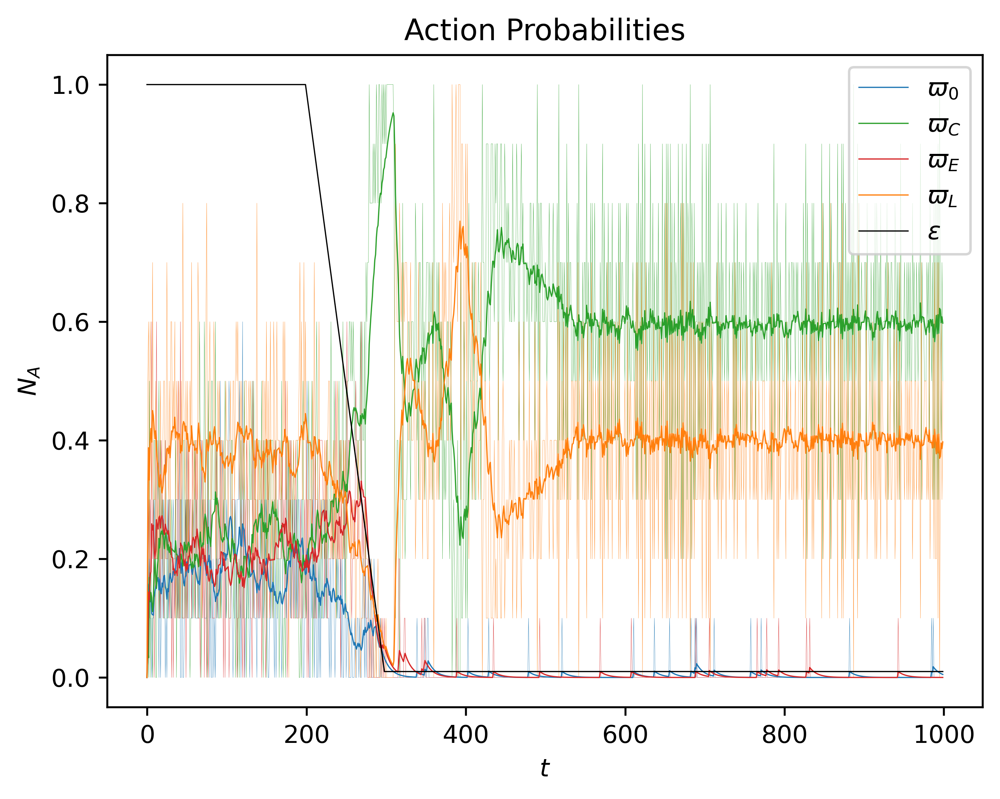

In [14]:
splt.plotA(lw1=0.5, lw2=0.1, ewm=True, alpha=0.1)

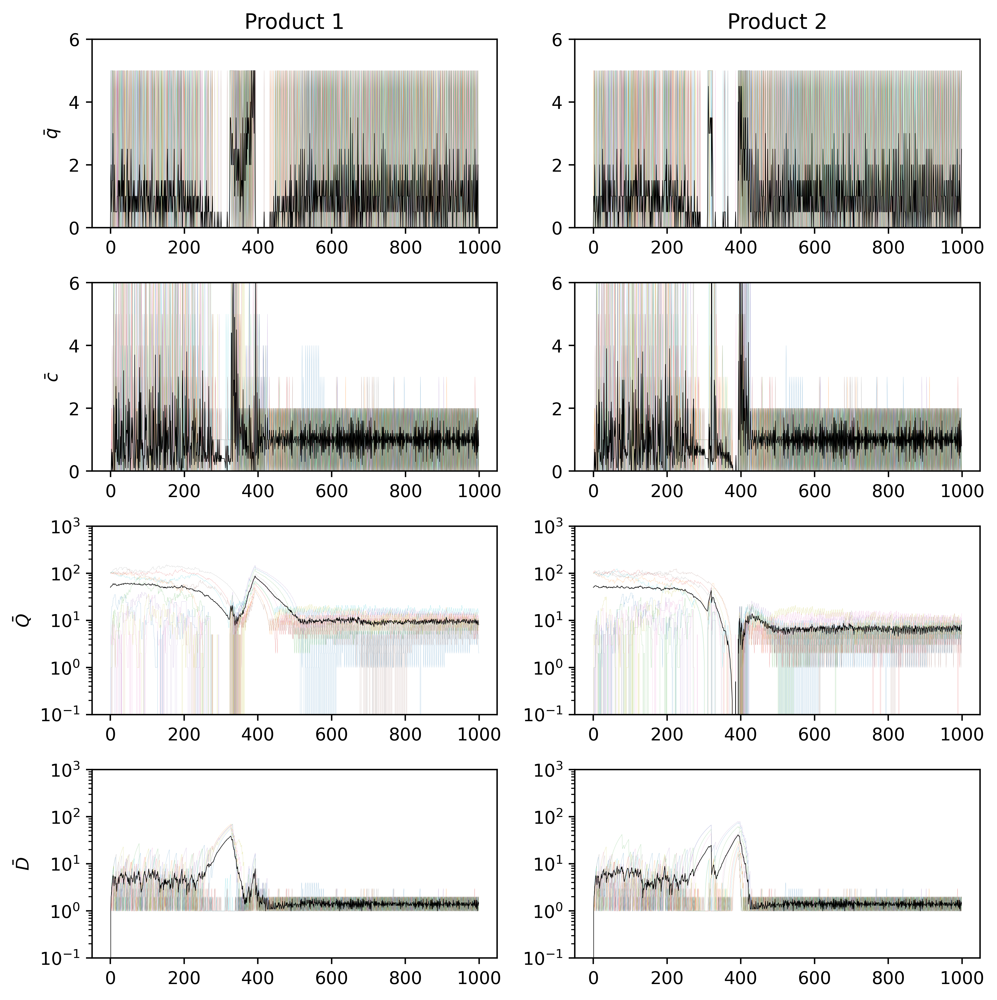

In [15]:
splt.plotQuantities(
    lw1=0.3, 
    lw2=0.05, 
    xmax=10, 
    tight_layout=True, 
    Qlog=True, 
    Dlog=True, 
    qmin=0, 
    qmax=6, 
    cmin=0, 
    cmax=6,
    Qmin = 1e-1,
    Qmax=1e3,
    Dmin=1e-1,
    Dmax=1e3,
)

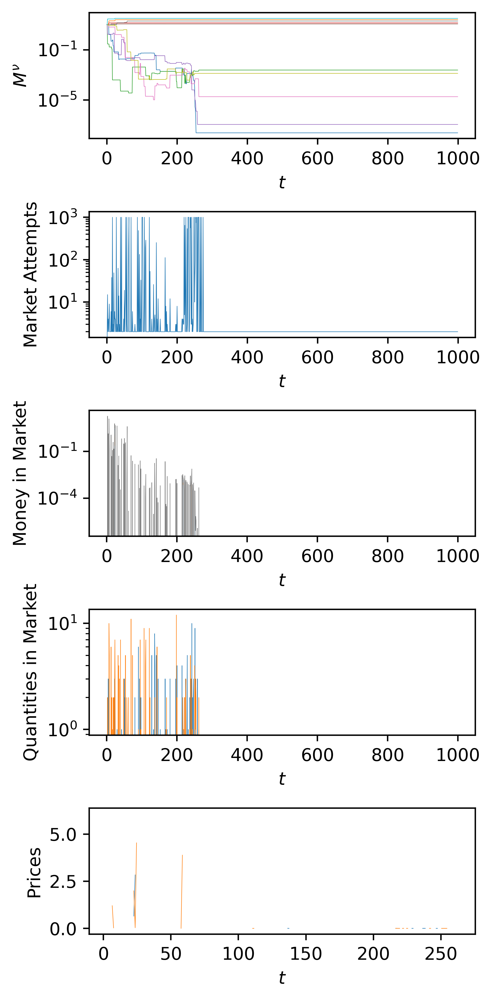

In [16]:
splt.plotMarket(lw1=0.3, lw2=0.05, Mlog=True, mNlog=True, mMlog=True, mElog=True, plog=False)

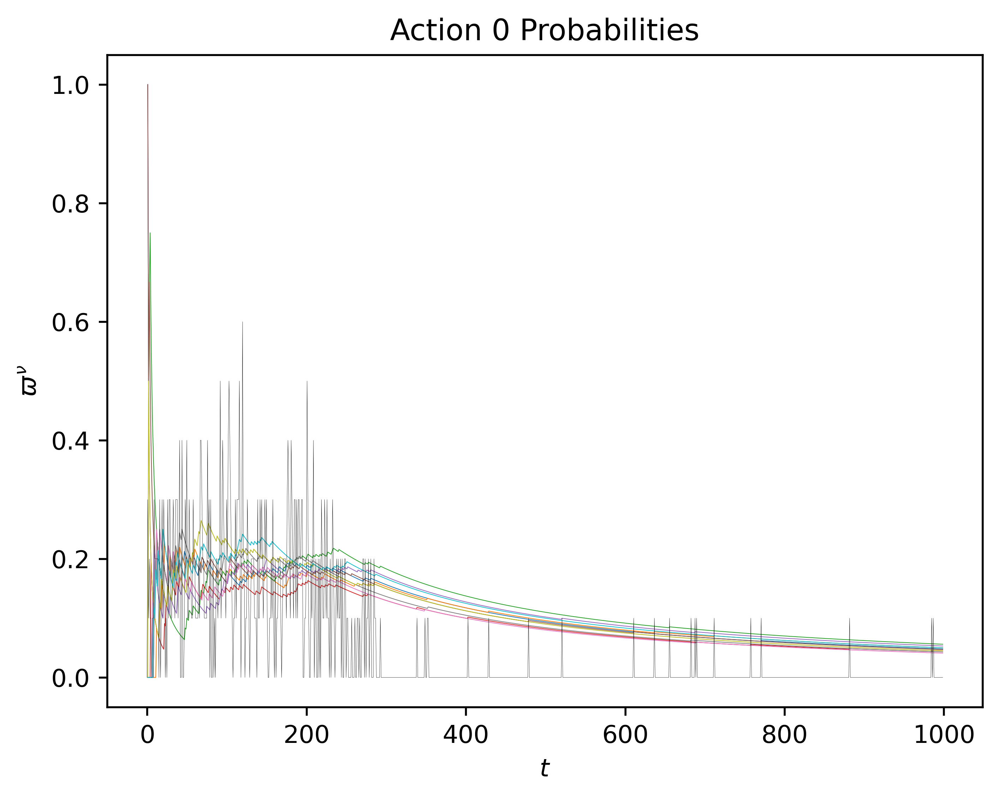

In [17]:
splt.plotPolicy(0)

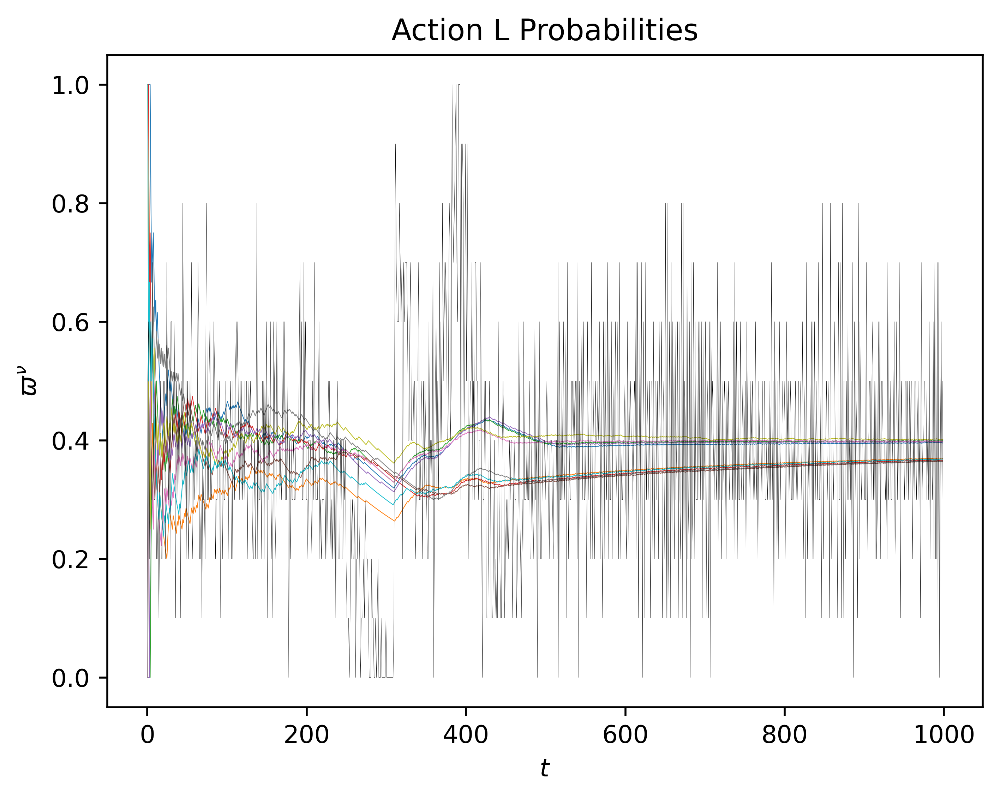

In [18]:
splt.plotPolicy('L')

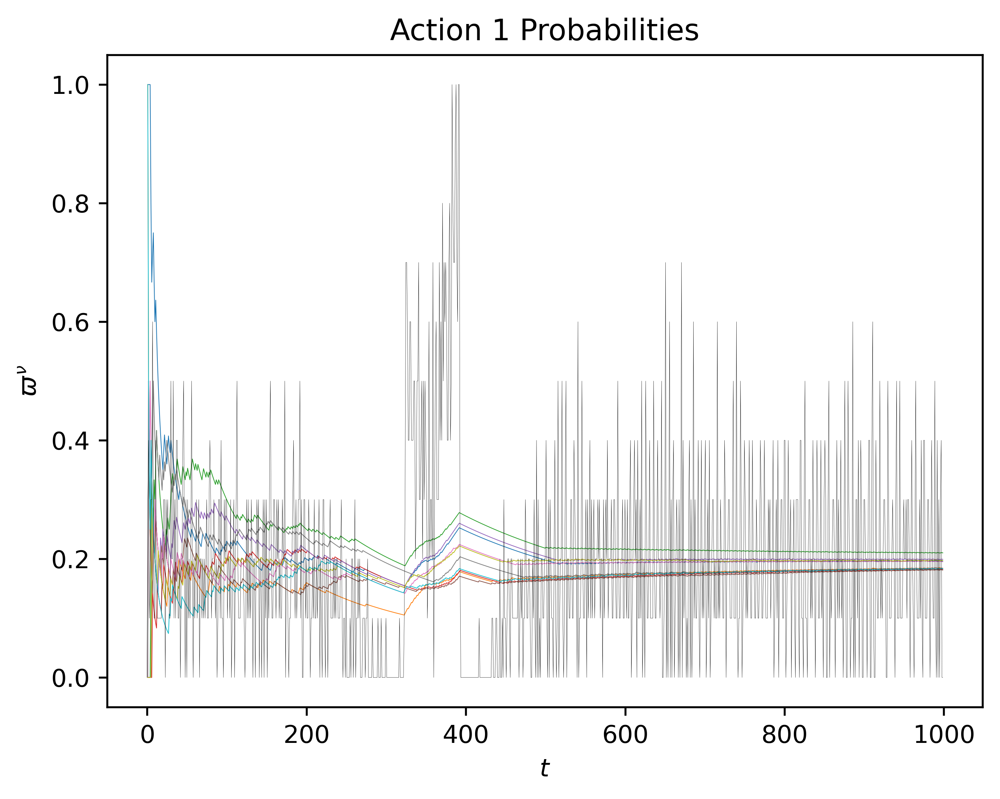

In [19]:
splt.plotPolicy(1)

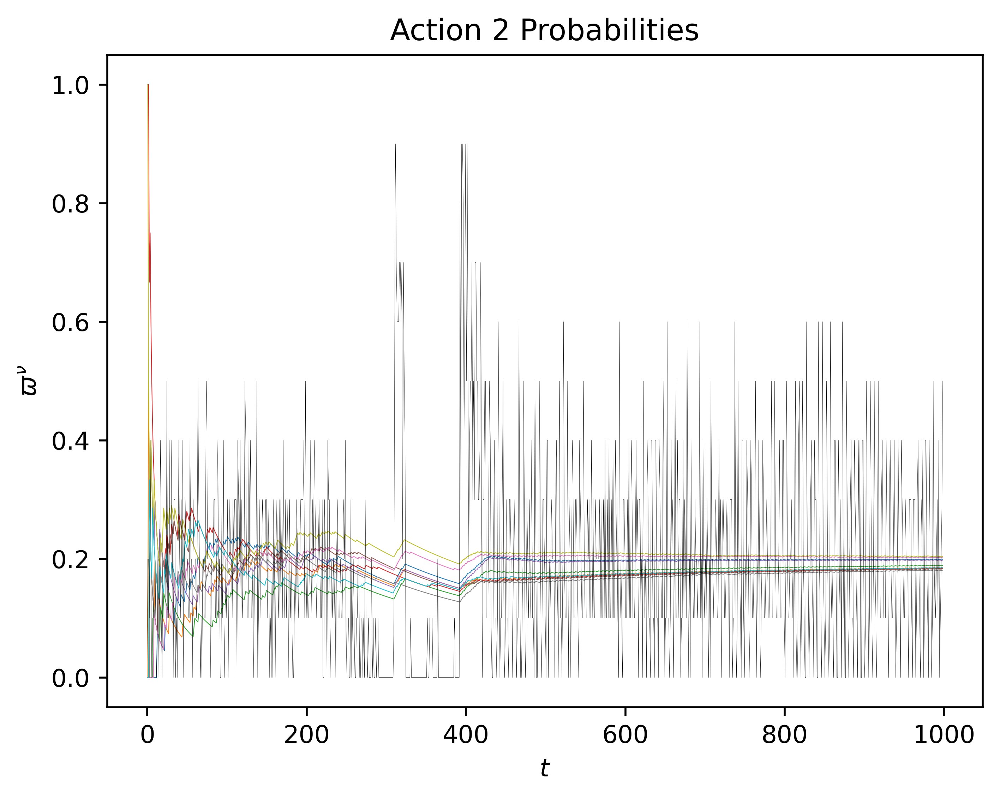

In [20]:
splt.plotPolicy(2)

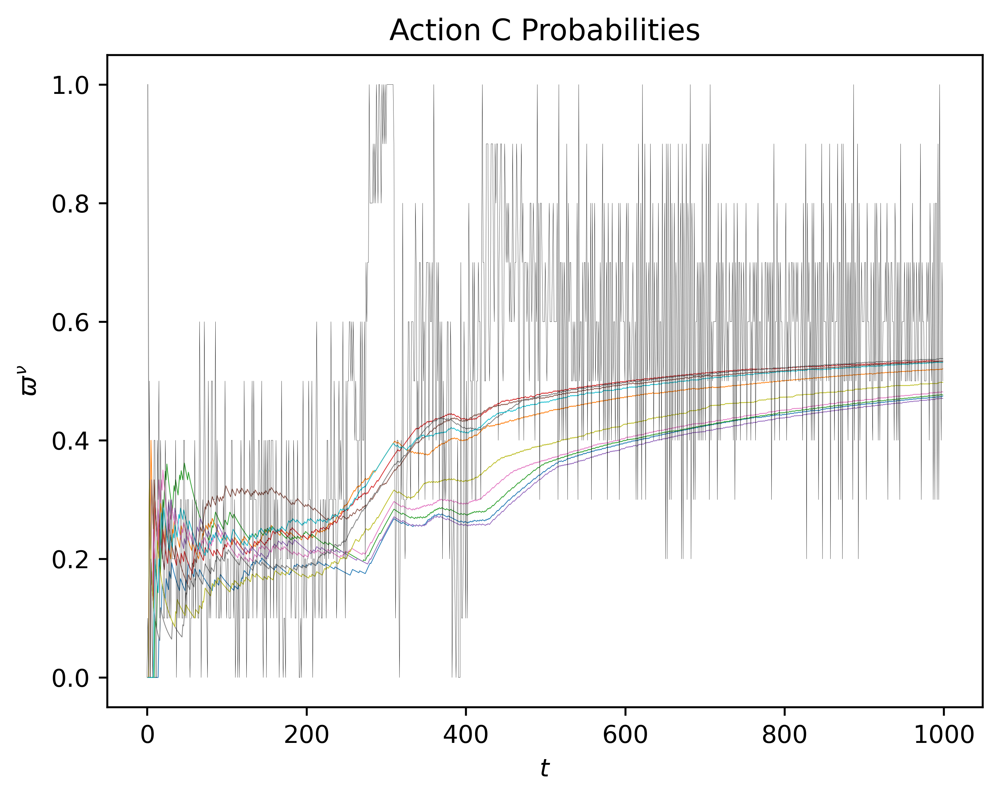

In [21]:
splt.plotPolicy('C')

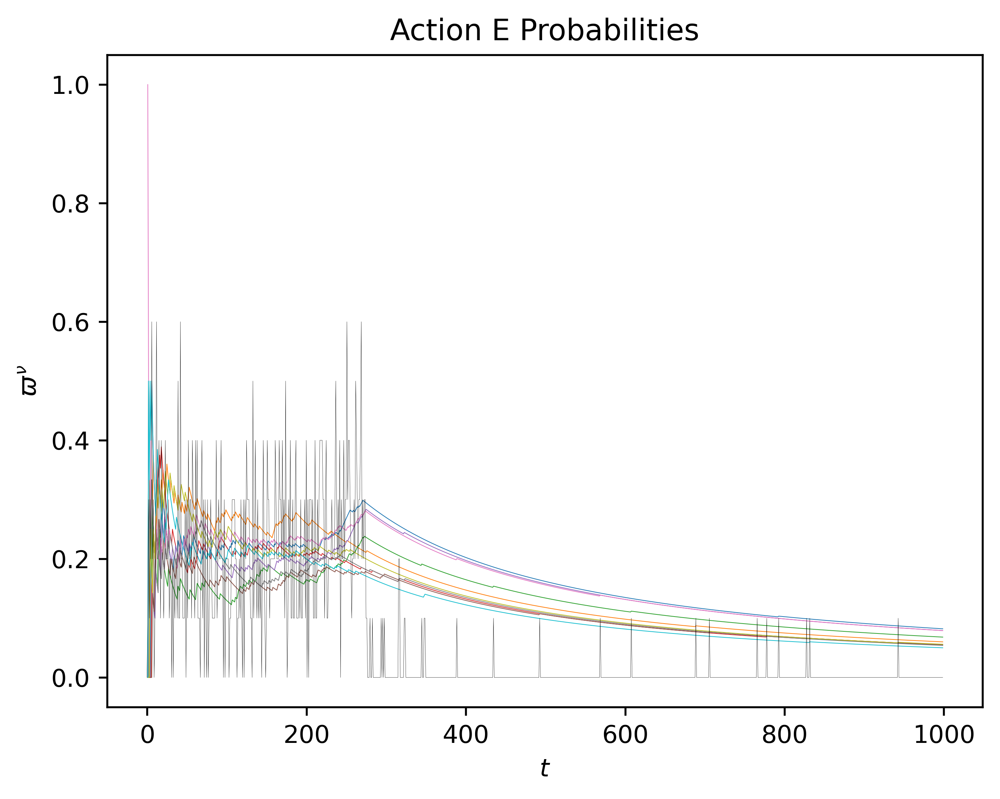

In [22]:
splt.plotPolicy('E')